## Import the libraries

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import math
import umap.umap_ as umap
from sklearn.metrics import davies_bouldin_score
%config InlineBackend.figure_format = 'svg'
import random

In [2]:
from sklearn import metrics
from sklearn.metrics import pairwise_distances
from sklearn.metrics import silhouette_score
from scipy.stats import f_oneway

## Import the dataset
This dataset has already been standardized


In [3]:
np.random.seed(42)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
data_with_target=pd.read_excel('/home/suhananujum/Telecom customer Preprocessed Data.xlsx')

In [4]:
data_with_target

,Unnamed: 0,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,0,0,0,1,0,-1.277445,0,1,0,0,2,0,0,0,0,0,1,2,-1.160323,-0.398608,0
1,1,1,0,0,0,0.066327,1,0,0,2,0,2,0,0,0,1,0,3,-0.259629,-0.948762,0
2,2,1,0,0,0,-1.236724,1,0,0,2,2,0,0,0,0,0,1,3,-0.362660,-1.641883,1
3,3,1,0,0,0,0.514251,0,1,0,2,0,2,2,0,0,1,0,0,-0.746535,-0.983710,0
4,4,0,0,0,0,-1.236724,1,0,1,0,0,0,0,0,0,0,1,2,0.197365,-1.235224,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,7038,1,0,1,1,-0.340876,1,2,0,2,0,2,2,2,2,1,1,3,0.665992,-0.879397,0
7039,7039,0,0,1,1,1.613701,1,2,1,0,2,2,0,2,2,1,1,1,1.277533,1.292099,0
7040,7040,0,0,1,1,-0.870241,0,1,0,2,0,0,0,0,0,0,1,2,-1.168632,-0.139680,0
7041,7041,1,1,1,0,-1.155283,1,2,1,0,0,0,0,0,0,0,1,3,0.320338,-0.316534,1


In [5]:
data_with_target=data_with_target.drop(["Unnamed: 0"],axis=1)

In [6]:
target=data_with_target.iloc[:,-1]

In [7]:
target.head()

0    0
1    0
2    1
3    0
4    1
Name: Churn, dtype: int64

In [8]:
data=data_with_target.drop(["Churn"],axis=1)

In [9]:
data

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
0,0,0,1,0,-1.277445,0,1,0,0,2,0,0,0,0,0,1,2,-1.160323,-0.398608
1,1,0,0,0,0.066327,1,0,0,2,0,2,0,0,0,1,0,3,-0.259629,-0.948762
2,1,0,0,0,-1.236724,1,0,0,2,2,0,0,0,0,0,1,3,-0.362660,-1.641883
3,1,0,0,0,0.514251,0,1,0,2,0,2,2,0,0,1,0,0,-0.746535,-0.983710
4,0,0,0,0,-1.236724,1,0,1,0,0,0,0,0,0,0,1,2,0.197365,-1.235224
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,1,0,1,1,-0.340876,1,2,0,2,0,2,2,2,2,1,1,3,0.665992,-0.879397
7039,0,0,1,1,1.613701,1,2,1,0,2,2,0,2,2,1,1,1,1.277533,1.292099
7040,0,0,1,1,-0.870241,0,1,0,2,0,0,0,0,0,0,1,2,-1.168632,-0.139680
7041,1,1,1,0,-1.155283,1,2,1,0,0,0,0,0,0,0,1,3,0.320338,-0.316534


## Feature types

In [10]:
data.columns

Index(['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure',
       'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity',
       'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod',
       'MonthlyCharges', 'TotalCharges'],
      dtype='object')

In [11]:
cont_list=['tenure','MonthlyCharges', 'TotalCharges']
ord_list=['PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity',
       'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'Contract']
nom_list=['gender', 'SeniorCitizen', 'Partner', 'Dependents','PaperlessBilling', 'PaymentMethod']

## Supervised UMAP in FDC
Now, for introducing supervised UMAP in the FDC algorithm

## Necessary Functions

In [12]:
from numba import jit

@jit(nopython=True)
def modified_canberra(a,b):
    return np.sqrt(np.sum(np.array([np.abs(1.0 - x) / (1.0 + np.abs(x)) for x in (np.abs(a-b) + 1.0)])))

In [13]:
def UMAP(UMAP_neb, min_dist_UMAP, metr, data, visual):
    import umap.umap_ as umap
   
    np.random.seed(42)
    colors_set1 = ["burlywood", "lightseagreen", "mediumorchid", "orange", "cornflowerblue", "plum", "yellowgreen"]
    customPalette_set1 = sns.set_palette(sns.color_palette(colors_set1))
    data_embedded = umap.UMAP(n_neighbors=UMAP_neb, min_dist=min_dist_UMAP, n_components=2, metric=metr, random_state=0).fit_transform(data)
    #data_embedded[:,0]=(data_embedded[:,0]- np.mean(data_embedded[:,0]))/np.std(data_embedded[:,0])
    #data_embedded[:,1]=(data_embedded[:,1]- np.mean(data_embedded[:,1]))/np.std(data_embedded[:,1])
    result = pd.DataFrame(data = data_embedded , 
        columns = ['UMAP_0', 'UMAP_1'])
    if visual==1:
        sns.lmplot( x="UMAP_0", y="UMAP_1",data=result,fit_reg=False,legend=False,scatter_kws={"s": 10},palette=customPalette_set1) # specify the point size
        #plt.savefig('clusters_umap_all.png', dpi=700, bbox_inches='tight')
        plt.show()
    else:
        pass
    return result

In [14]:
### FDC parameters is a 2-d list
### each row is for cont ord and nom features
### each entry in each row is for UMAP_neb,min_dist_UMAP, metric

def FDC_label(data, cont_list, nom_list, ord_list, FDC_parameters, drop_nominal, visual):
    np.random.seed(42)

    
    colors_set1 = ["burlywood", "lightcoral", "lightseagreen", "mediumorchid", "orange", "cornflowerblue", "plum", "yellowgreen"]
    customPalette_set1 = sns.set_palette(sns.color_palette(colors_set1))
    
    cont_df=data[cont_list]
    nom_df=data[nom_list]
    ord_df=data[ord_list]
    cont_emb=UMAP(FDC_parameters[0][0],FDC_parameters[0][1], FDC_parameters[0][2], cont_df, 0) #Reducing continueous features into 2dim
    ord_emb=UMAP(FDC_parameters[1][0],FDC_parameters[1][1], FDC_parameters[1][2], ord_df, 0) #Reducing ordinal features into 2dim
    nom_emb=UMAP(FDC_parameters[2][0],FDC_parameters[2][1], FDC_parameters[2][2], nom_df, 0) #Reducing nominal features into 2dim
    
    if drop_nominal==1:
        result_concat=pd.concat([ord_emb, cont_emb, nom_emb.drop(['UMAP_1'],axis=1)],axis=1) #concatinating all reduced dimensions to get 5D embeddings(1D from nominal)
    else:
        result_concat=pd.concat([ord_emb, cont_emb, nom_emb],axis=1)
    data_embedded = umap.UMAP(n_neighbors=10, min_dist=0.01, n_components=2, metric='euclidean', random_state=42).fit_transform(result_concat,y=target) #reducing 5D embeddings to 2D using UMAP
    result_reduced = pd.DataFrame(data = data_embedded , 
        columns = ['FDC_0', 'FDC_1'])
    
    if visual==1:
        sns.lmplot( x="FDC_0", y="FDC_1",data=result_reduced,fit_reg=False,legend=False,scatter_kws={"s": 10},palette=customPalette_set1) # specify the point size
        plt.show()
        #plt.savefig('clusters_umap_all.png', dpi=700, bbox_inches='tight')
    else:
        pass
    return result_reduced #returns both 5D and 2D embeddings

Is it neccessary to standardize the data_embedded?

In [15]:
## Clustering parameters is a list of parameters for each clustering algorithms that will be unpacked inside the function
## if clustering_algorithm is DBSCAN clustering_parameters {"eps":value, "min_samples":value}
## if clustering_algorithm is KMEANS clustering_parameters {"n_clusters":value}
## if clustering_algorithm is AGGLO clustering_parameters {"n_clusters":value, "metric":value, "linkage":value}
## algo_dim_reduction has two values UMAP and FDC

def Clustering(low_d_embedding, algo_dim_reduction, clustering_parameters, clustering_algorithm, visual):
    np.random.seed(42)
    from sklearn.metrics import silhouette_score
    from sklearn.cluster import DBSCAN
    from sklearn.cluster import KMeans
    from sklearn.cluster import AgglomerativeClustering
    
    colors_set1 = ["burlywood", "lightcoral", "lightseagreen", "mediumorchid", "orange",  "cornflowerblue", "plum", "yellowgreen"]
    customPalette_set1 = sns.set_palette(sns.color_palette(colors_set1))
    
    if clustering_algorithm=="DBSCAN":
        clustering = DBSCAN(eps=clustering_parameters["eps"], min_samples=clustering_parameters["min_samples"]).fit(low_d_embedding)
    
    elif clustering_algorithm=="KMEANS":
        clustering = KMeans(n_clusters=clustering_parameters["n_clusters"], random_state=42).fit(low_d_embedding)
    
    elif clustering_algorithm=="AGGLO":
        clustering = AgglomerativeClustering(n_clusters=clustering_parameters["n_clusters"], metric=clustering_parameters["metric"], linkage=clustering_parameters["linkage"]).fit(low_d_embedding)
        
    else:
        return (print ("Invalid Clusering Algorithm Name"))
    
    clusters=clustering.fit_predict(low_d_embedding)
    (values,counts) = np.unique(clusters,return_counts=True)
    low_d_embedding['Cluster'] = clusters
    
    
    if visual==1:
        sns.lmplot( x=algo_dim_reduction+"_0", y=algo_dim_reduction+"_1",
        data=low_d_embedding,
        fit_reg=False, 
        legend=True,
        hue='Cluster', # color by cluster
        scatter_kws={"s": 10},palette=customPalette_set1) # specify the point size
        plt.savefig(clustering_algorithm+'.png', dpi=700, bbox_inches='tight')
        plt.show()
    else:
        pass
    
    cluster_labels=low_d_embedding.Cluster.to_list()
    
    if len(np.unique(np.array(cluster_labels)))>1:
        silhouette_score=silhouette_score(low_d_embedding,cluster_labels)
    else:
        silhouette_score=0
        
    return cluster_labels,counts,silhouette_score

In [16]:
def db_score(data,features):
    score=davies_bouldin_score(X=data,labels=features)
    return score

In [17]:
def parameter_optimization_UMAP_KMEANS(iterations, data):
    random.seed(42)
    np.random.seed(42)
    
    parameter_records_with_sil_score=[]
    for run in range (iterations):
        
        print('Running iteration number ', run+1 )
        
        n_neighbors_sample=random.choice(n_neighbors)
        min_dist_sample=random.choice(min_dist)
        n_clusters_sample=random.choice(n_clusters)

        
        UMAP_emb=UMAP(n_neighbors_sample, min_dist_sample, "euclidean", data, 0)
        
        cluster_labels, counts, sil_score=Clustering(UMAP_emb, "UMAP", {"n_clusters":n_clusters_sample}, "KMEANS",0 )
        
        
        record=[n_neighbors_sample, min_dist_sample, n_clusters_sample, sil_score]
        parameter_records_with_sil_score.append(record)

    parameter_records_with_sil_score=np.array(parameter_records_with_sil_score)
    
    parameter_records_with_sil_score = sorted(parameter_records_with_sil_score, key=lambda parameter_records_with_sil_score_entry: parameter_records_with_sil_score_entry[-1]) 
    
    return parameter_records_with_sil_score

In [18]:
def parameter_optimization_FDC_KMEANS(iterations, data):
    random.seed(42)
    np.random.seed(42)
    
    parameter_records_with_sil_score=[]
    for run in range (iterations):
        
        print('Running iteration number ', run+1 )
        
        n_neighbors_sample=random.choice(n_neighbors)
        min_dist_sample=random.choice(min_dist)
        n_clusters_sample=random.choice(n_clusters)

        
        FDC_emb=FDC_label(data, cont_list, nom_list, ord_list, [[n_neighbors_sample, min_dist_sample, "euclidean"],[n_neighbors_sample, min_dist_sample, modified_canberra],[n_neighbors_sample, min_dist_sample, "hamming"]], 1, 0)
        
        cluster_labels, counts, sil_score=Clustering(FDC_emb, "FDC", {"n_clusters":n_clusters_sample}, "KMEANS",0 )
        
        
        record=[n_neighbors_sample, min_dist_sample, n_clusters_sample, sil_score]
        parameter_records_with_sil_score.append(record)

    parameter_records_with_sil_score=np.array(parameter_records_with_sil_score)
    
    parameter_records_with_sil_score = sorted(parameter_records_with_sil_score, key=lambda parameter_records_with_sil_score_entry: parameter_records_with_sil_score_entry[-1]) 
    
    return parameter_records_with_sil_score

In [19]:
def parameter_optimization_UMAP_DBSCAN(iterations, data):
    random.seed(42)
    np.random.seed(42)
    
    parameter_records_with_sil_score=[]
    for run in range (iterations):
        
        print('Running iteration number ', run+1 )
        
        n_neighbors_sample=random.choice(n_neighbors)
        min_dist_sample=random.choice(min_dist)
        eps_sample=random.choice(eps)
        min_samples_sample=random.choice(min_samples)

        
        UMAP_emb=UMAP(n_neighbors_sample, min_dist_sample, "euclidean", data, 0)
        
        cluster_labels, counts, sil_score=Clustering(UMAP_emb, "UMAP", {"eps":eps_sample,"min_samples":min_samples_sample}, "DBSCAN",0 )
        
        
        record=[n_neighbors_sample, min_dist_sample, eps_sample, min_samples_sample, sil_score]
        parameter_records_with_sil_score.append(record)

    parameter_records_with_sil_score=np.array(parameter_records_with_sil_score)
    
    parameter_records_with_sil_score = sorted(parameter_records_with_sil_score, key=lambda parameter_records_with_sil_score_entry: parameter_records_with_sil_score_entry[-1]) 
    
    return parameter_records_with_sil_score

In [20]:
def parameter_optimization_FDC_DBSCAN(iterations, data):
    random.seed(42)
    np.random.seed(42)
    
    parameter_records_with_sil_score=[]
    for run in range (iterations):
        
        print('Running iteration number ', run+1 )
        
        n_neighbors_sample=random.choice(n_neighbors)
        min_dist_sample=random.choice(min_dist)
        eps_sample=random.choice(eps)
        min_samples_sample=random.choice(min_samples)

        
        FDC_emb=FDC_label(data, cont_list, nom_list, ord_list, [[n_neighbors_sample, min_dist_sample, "euclidean"],[n_neighbors_sample, min_dist_sample, modified_canberra],[n_neighbors_sample, min_dist_sample, "hamming"]], 1, 0)
        
        cluster_labels, counts, sil_score=Clustering(FDC_emb, "FDC",  {"eps":eps_sample,"min_samples":min_samples_sample}, "DBSCAN", 0 )
        
        
        record=[n_neighbors_sample, min_dist_sample, eps_sample,min_samples_sample, sil_score]
        parameter_records_with_sil_score.append(record)

    parameter_records_with_sil_score=np.array(parameter_records_with_sil_score)
    
    parameter_records_with_sil_score = sorted(parameter_records_with_sil_score, key=lambda parameter_records_with_sil_score_entry: parameter_records_with_sil_score_entry[-1]) 
    
    return parameter_records_with_sil_score

## Compare UMAP and Supervised FDC for k-Means

### UMAP

In [21]:
n_neighbors = [6, 9, 12, 15, 18, 21, 24, 27, 30]
min_dist= [0.001, 0.01, 0.1]
n_clusters=[2, 3, 4, 5, 6, 7, 8, 9, 10]

In [22]:
records_UMAP_KMEANS= parameter_optimization_UMAP_KMEANS(10, data)

Running iteration number  1
Running iteration number  2
Running iteration number  3
Running iteration number  4
Running iteration number  5
Running iteration number  6
Running iteration number  7
Running iteration number  8
Running iteration number  9
Running iteration number  10


In [23]:
best_parameters_UMAP_KMEANS=records_UMAP_KMEANS[-1]

In [24]:
best_parameters_UMAP_KMEANS

array([1.50000000e+01, 1.00000000e-03, 1.00000000e+01, 6.87490253e-01])

Output is in the form [n_neighbors_sample, min_dist_sample, n_clusters_sample, sil_score]

##### Best parameter choices
UMAP
- n_neighbours=15
- min_dist=0.001

k-Means
- num_clusters=10

Sil score
- 0.68


UMAP function is defined as
def UMAP(UMAP_neb, min_dist_UMAP, metr, data, visual):

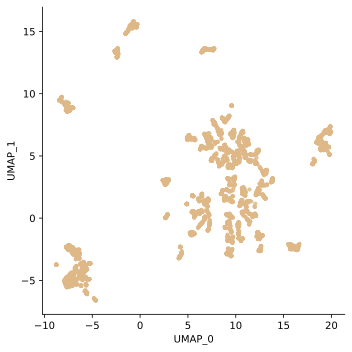

In [20]:
UMAP_emb=UMAP(15, 0.001, "euclidean", data, 1)

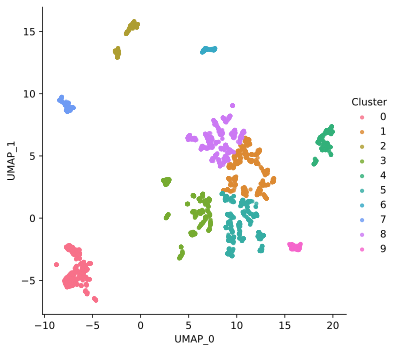

In [21]:
cluster_labels_UMAP_KMEANS,counts_UMAP_KMEANS,silhouette_score_UMAP_KMEANS=Clustering(UMAP_emb, "UMAP", {"n_clusters":10}, "KMEANS", 1)

In [22]:
print("Sihouette Score K-Means-UMAP", silhouette_score_UMAP_KMEANS)

Sihouette Score K-Means-UMAP 0.6874902528527902


Why should we get 10 clusters when we know that there are only two classes, shouldnt an ideal result form only two clusters

### Supervised FDC 
Varied from Unsupervised FDC

In [23]:
n_neighbors = [6, 9, 12, 15, 18, 21, 24, 27, 30]
min_dist= [0.001, 0.01, 0.1]
n_clusters=[2, 3, 4, 5, 6, 7, 8, 9, 10]

In [26]:
records_FDC_KMEANS= parameter_optimization_FDC_KMEANS(10, data)

Running iteration number  1
Running iteration number  2
Running iteration number  3
Running iteration number  4
Running iteration number  5
Running iteration number  6
Running iteration number  7
Running iteration number  8
Running iteration number  9
Running iteration number  10


In [27]:
best_parameters_FDC_KMEANS=records_FDC_KMEANS[-1]

In [28]:
best_parameters_FDC_KMEANS

array([6.        , 0.1       , 5.        , 0.55944184])

##### Best parameter choices
UMAP
- n_neighbours=6
- min_dist=0.1

k-Means
- num_clusters=5

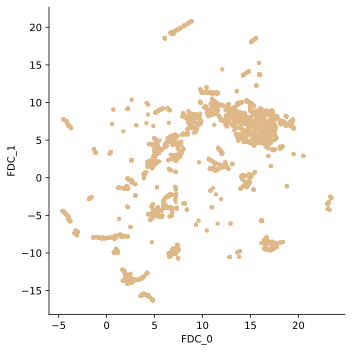

In [24]:
FDC_emb=FDC_label(data, cont_list, nom_list, ord_list, [[6, 0.1, "euclidean"],[6, 0.1, modified_canberra],[6, 0.1, "hamming"]], 1, 1)

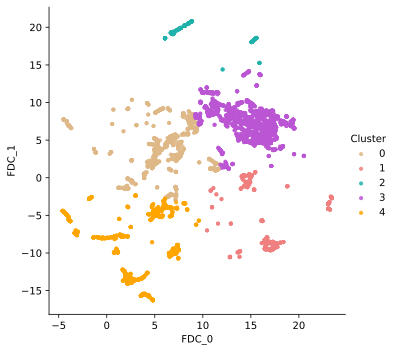

In [25]:
cluster_labels_FDC_KMEANS,counts_FDC_KMEANS,silhouette_score_FDC_KMEANS=Clustering(FDC_emb, "FDC", {"n_clusters":5}, "KMEANS", 1)

In [26]:
print("Sihouette Score K-Means-FDC", silhouette_score_FDC_KMEANS)

Sihouette Score K-Means-FDC 0.5179638943668519


## Compare UMAP and Supervised FDC for DBSCAN

### UMAP
Varied from before

In [33]:
n_neighbors = [6, 9, 12, 15, 18, 21, 24, 27, 30]
min_dist= [0.001, 0.01, 0.1]
eps=[0.01, 0.05, 0.1, 0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4, 4.5]
min_samples=[5, 10, 20, 30]

In [34]:
records_UMAP_DBSCAN= parameter_optimization_UMAP_DBSCAN(20, data)

Running iteration number  1
Running iteration number  2
Running iteration number  3
Running iteration number  4
Running iteration number  5
Running iteration number  6
Running iteration number  7
Running iteration number  8
Running iteration number  9
Running iteration number  10
Running iteration number  11
Running iteration number  12
Running iteration number  13
Running iteration number  14
Running iteration number  15
Running iteration number  16
Running iteration number  17
Running iteration number  18
Running iteration number  19
Running iteration number  20


In [35]:
best_parameters_UMAP_DBSCAN=records_UMAP_DBSCAN[-1]

In [36]:
best_parameters_UMAP_DBSCAN

array([1.50000000e+01, 1.00000000e-03, 1.00000000e-01, 5.00000000e+00,
       9.11549473e-01])

##### Best parameter choices
UMAP
- n_neighbours=15
- min_dist=0.001

DBSCAN
- eps=0.1
- min_samples=5

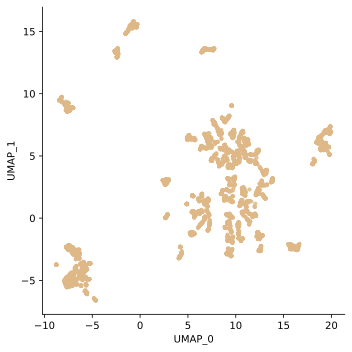

In [27]:
UMAP_emb=UMAP(15, 0.001, "euclidean", data, 1)

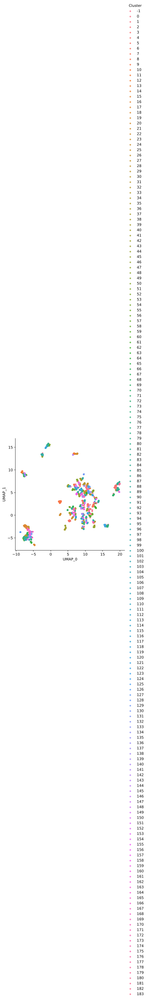

In [28]:
cluster_labels_UMAP_DBSCAN,counts_UMAP_DBSCAN,silhouette_score_UMAP_DBSCAN=Clustering(UMAP_emb, "UMAP", {"eps":0.1,"min_samples":5}, "DBSCAN", 1)

### Supervised FDC
No variation from unsupervised fdc


In [41]:
records_FDC_DBSCAN= parameter_optimization_FDC_DBSCAN(20, data)

Running iteration number  1
Running iteration number  2
Running iteration number  3
Running iteration number  4
Running iteration number  5
Running iteration number  6
Running iteration number  7
Running iteration number  8
Running iteration number  9
Running iteration number  10
Running iteration number  11
Running iteration number  12
Running iteration number  13
Running iteration number  14
Running iteration number  15
Running iteration number  16
Running iteration number  17
Running iteration number  18
Running iteration number  19
Running iteration number  20


In [43]:
best_parameters_FDC_DBSCAN=records_FDC_DBSCAN[-1]

In [44]:
best_parameters_FDC_DBSCAN

array([1.50000000e+01, 1.00000000e-03, 1.00000000e-01, 5.00000000e+00,
       8.75628833e-01])

##### Best parameter choices
UMAP
- n_neighbours=15
- min_dist=0.001

DBSCAN
- eps=0.1
- min_samples=5

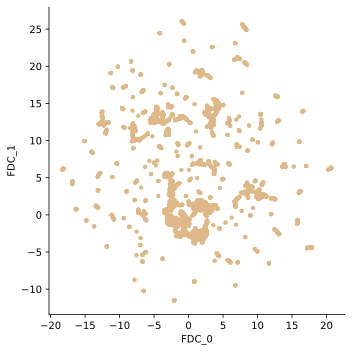

In [30]:
FDC_emb=FDC_label(data, cont_list, nom_list, ord_list, [[15, 0.001, "euclidean"],[15, 0.001, modified_canberra],[15, 0.001, "hamming"]], 1, 1)

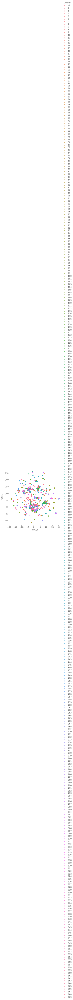

In [31]:
cluster_labels_FDC_DBSCAN,counts_FDC_DBSCAN,silhouette_score_FDC_DBSCAN=Clustering(FDC_emb, "FDC", {"eps":0.1,"min_samples":5}, "DBSCAN", 1)

## Compare UMAP and FDC for Agglomerative clustering
Havent run this yet

### UMAP

In [ ]:
def parameter_optimization_UMAP_AGGLO(iterations, data):
    random.seed(42)
    np.random.seed(42)
    
    parameter_records_with_sil_score=[]
    for run in range (iterations):
        
        print('Running iteration number ', run+1 )
        
        n_neighbors_sample=random.choice(n_neighbors)
        min_dist_sample=random.choice(min_dist)
        n_clusters_sample=ranodm.choice(n_clusters)
        linkage_sample=random.choice(linkage)
        metric_sample=random.choice(metric)

        
        UMAP_emb=UMAP(n_neighbors_sample, min_dist_sample, "euclidean", data, 0)
        
        cluster_labels, counts, sil_score=Clustering(UMAP_emb, "UMAP", {"n_clusters":n_clusters_sample,"metric":metric_sample,"linkage":linkage_sample}, "AGGLO",0 )
        
        
        record=[n_neighbors_sample, min_dist_sample, n_clusters, metric_sample, linkage_sample, sil_score]
        parameter_records_with_sil_score.append(record)

    parameter_records_with_sil_score=np.array(parameter_records_with_sil_score)
    
    parameter_records_with_sil_score = sorted(parameter_records_with_sil_score, key=lambda parameter_records_with_sil_score_entry: parameter_records_with_sil_score_entry[-1]) 
    
    return parameter_records_with_sil_score

In [ ]:
n_neighbors = [6, 9, 12, 15, 18, 21, 24, 27, 30]
min_dist= [0.001, 0.01, 0.1]
n_clusters=[2, 3, 4, 5, 6, 7, 8, 9, 10]
linkage=["ward", "complete", "average", "single"]
metric=["euclidean","l1","manhattan","cosine"]

### Supervised FDC

In [ ]:
def parameter_optimization_FDC_AGGLO(iterations, data):
    random.seed(42)
    np.random.seed(42)
    
    parameter_records_with_sil_score=[]
    for run in range (iterations):
        
        print('Running iteration number ', run+1 )
        
        n_neighbors_sample=random.choice(n_neighbors)
        min_dist_sample=random.choice(min_dist)
        n_clusters_sample=ranodm.choice(n_clusters)
        linkage_sample=random.choice(linkage)
        metric_sample=random.choice(metric)

        
        FDC_emb=FDC_label(data, cont_list, nom_list, ord_list, [[n_neighbors_sample, min_dist_sample, "euclidean"],[n_neighbors_sample, min_dist_sample, modified_canberra],[n_neighbors_sample, min_dist_sample, "hamming"]], 1, 0)
        
        cluster_labels, counts, sil_score=Clustering(FDC_emb, "FDC",  {"n_clusters": n_clusters_sample,"metric":metric_sample,"linkage":linkage_sample}, "AGGLO",0 )
        
        
        record=[n_neighbors_sample, min_dist_sample, linkage_sample, metric_sample,sil_score]
        parameter_records_with_sil_score.append(record)

    parameter_records_with_sil_score=np.array(parameter_records_with_sil_score)
    
    parameter_records_with_sil_score = sorted(parameter_records_with_sil_score, key=lambda parameter_records_with_sil_score_entry: parameter_records_with_sil_score_entry[-1]) 
    
    return parameter_records_with_sil_score

In [ ]:
n_neighbors = [6, 9, 12, 15, 18, 21, 24, 27, 30]
min_dist= [0.001, 0.01, 0.1]
n_clusters=[2, 3, 4, 5, 6, 7, 8, 9, 10]
linkage=["ward", "complete", "average", "single"]
metric=["euclidean","l1","manhattan","cosine"]